In [1]:
import networkx as nx
from matplotlib import pyplot as plt
import igraph
import numpy as np
from networkx.algorithms import community
from networkx.algorithms import bipartite
import pandas as pd
from scipy.stats import linregress, pearsonr
import seaborn as sns
import scipy.stats


In [16]:
import nxviz as nv 
from nxviz import annotate

# 1. Import data 

In [4]:
rating = pd.read_csv('/Users/echo/Desktop/Network/assignment/amazon_ratings.csv',sep=' ',index_col=False,names=['user','index','weight','product'])
rating = rating.iloc[2:,:].drop(columns=['index']).drop_duplicates()

/var/folders/5c/b4clvbcx6dg9wx0l8hdm3hf80000gn/T/ipykernel_2687/2836683996.py:1: DtypeWarning: Columns (0,1,2) have mixed types. Specify dtype option on import or set low_memory=False.
  rating = pd.read_csv('/Users/echo/Desktop/Network/assignment/amazon_ratings.csv',sep=' ',index_col=False,names=['user','index','weight','product'])


In [17]:
rating.dtypes

user        object
weight      object
product    float64
dtype: object

In [7]:
rating.head()

,user,weight,product
2,1,5.0,1.117404e+09
3,1,1.0,1.105916e+09
4,1,5.0,1.105916e+09
5,1,1.0,1.105571e+09
6,1,1.0,1.104966e+09


In [125]:
# get the list of products that got reviews from more than 50 clients 
product_reviews = rating.groupby('product')['user'].count().reset_index()
# get these products that have more than 50 reviews  
target_products = product_reviews[product_reviews['user']>50][['product']]
# get customerID => extract 5000 samples 
target_user = pd.merge(target_products,rating,on='product')[['user']].drop_duplicates().iloc[:2000,:]
len(target_user)

2000

In [126]:
edge_list = pd.merge(target_user,rating,on='user')
edge_list.columns=['source','weight','target']
edge_list.head()

,source,weight,target
0,10591,3.0,931557600.0
1,10591,3.0,927496800.0
2,10591,3.0,922917600.0
3,10591,4.0,917391600.0
4,10591,4.0,907884000.0


Get the edge_list and node_list for plot in gephi( don't need to run it)

In [18]:
edge_list['source']=edge_list['source'].apply(lambda x: 'C'+str(x))
edge_list['target']=edge_list['target'].apply(lambda x: 'P'+str(x))

# export to edgelist.csv
edge_list.to_csv('./edge_list.csv')

df1 = pd.DataFrame({'node':edge_list['source'],'type':'customer'})
df2 = pd.DataFrame({'node':edge_list['target'],'type':'product'})
node_list = pd.concat([df1,df2],axis=0).drop_duplicates()
node_list.to_csv('./nodelist.csv')

,source,weight,target
0,C13098,4.0,P1137538800.0
1,C13098,2.0,P1136502000.0
2,C13098,1.0,P1136502000.0
3,C13098,1.0,P1136415600.0
4,C13098,4.0,P1135724400.0


# 2. Network Creation

In [23]:
edge_list = pd.read_csv('/Users/echo/Desktop/Network/assignment/rating_update.csv',sep=',',index_col=False)
edge_list.head()

,source,target,weight
0,1414,950223600,5
1,1414,950223600,4
2,1414,898725600,3
3,1414,898725600,4
4,1414,898207200,1


In [27]:
# get the bipartite network for customer-product 
bipartite_G = nx.Graph()

for idx,values in edge_list.iterrows():
    cid = 'C{0}'.format(values['source'])
    pid = 'P{0}'.format(values['target'])
    bipartite_G.add_node(cid, bipartite='customer')
    bipartite_G.add_node(pid, bipartite='product')
    bipartite_G.add_edge(cid, pid, weight=values['weight'])
    
bipartite_G = nx.Graph(bipartite_G) 
bipartite_G.remove_edges_from( nx.selfloop_edges(bipartite_G) )     # Remove self-loops

In [28]:
print(bipartite_G.number_of_edges())
print(bipartite_G.number_of_nodes())
print('If graph is bipartite:',bipartite.is_bipartite(bipartite_G))

16985
5178
If graph is bipartite: True


In [5]:
colors =[]

for node in bipartite_G:
    if node.startswith('C'):
        colors.append("blue")
    else:
        colors.append("yellow")
    

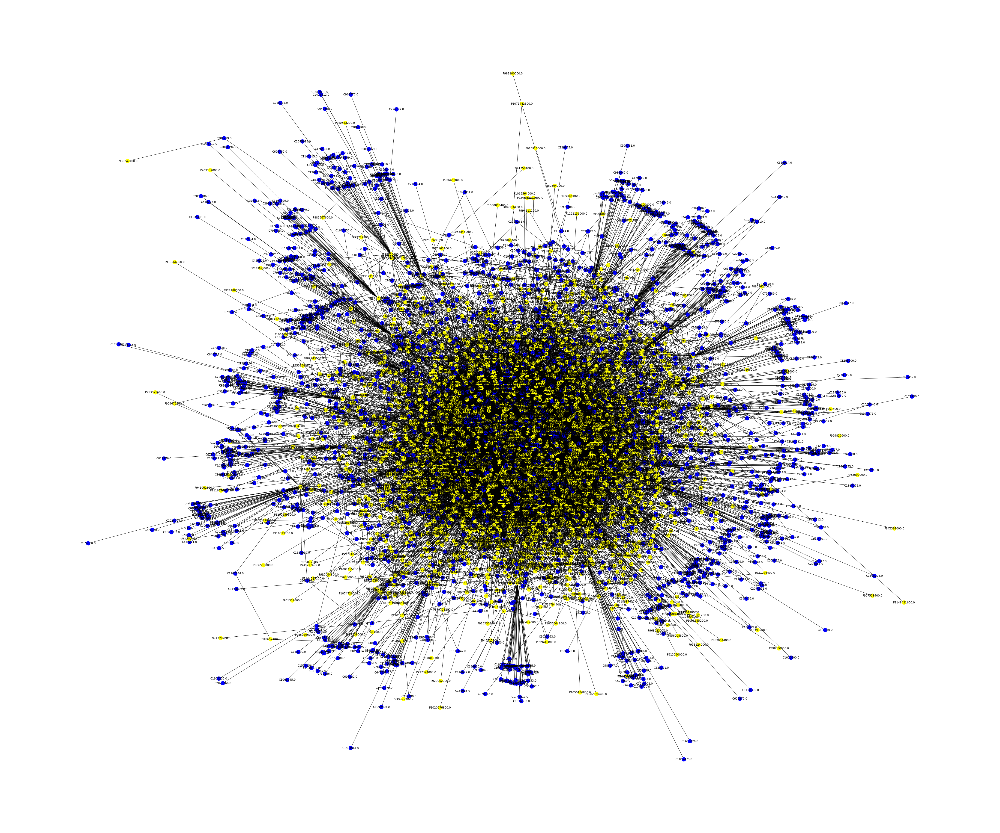

In [11]:
# plot the data 
%matplotlib inline
plt.figure(figsize=(60,50))
pos = nx.spring_layout(bipartite_G, iterations=15, seed=1721)
nx.draw(bipartite_G,with_labels = True,pos = pos,node_color=colors)

<h3> Network Characteristic </h3> 

In [33]:
x,y = bipartite.sets(bipartite_G)

In [59]:
den = round(bipartite.density(bipartite_G,x),4)
cc = bipartite.average_clustering(bipartite_G,x)
cp = bipartite.average_clustering(bipartite_G,y)
ass =nx.degree_assortativity_coefficient(bipartite_G, weight = True)

In [69]:
dict_cha = {'node_client':len(x),\
            'node_product':len(y),\
            'Density':den,\
           'Clustering_Coef_Cli':cc,\
           'Clustering_Coef_Pro':cp,\
            'Assortativity':ass}

df_structure = pd.DataFrame(dict_cha,index=[0])
df_structure

,node_client,node_product,Density,Clustering_Coef_Cli,Clustering_Coef_Pro,Assortativity
0,2000,3178,0.0027,0.343809,0.136055,-0.349413


# Centrality&Clustering analysis 

<h3> 1. Degree </h3>


In [99]:
# get all client nodes and all product nodes 
x,y = bipartite.sets(bipartite_G)

In [108]:
degC = nx.bipartite.degree_centrality(bipartite_G,x)

In [112]:
client_degree = [ i for i in degC.items() if i[0].startswith('C')]
print(sorted(client_degree,key=lambda x:x[1],reverse=True)[:5])
product_degree = [ i for i in degC.items() if i[0].startswith('P')]
print(sorted(product_degree,key=lambda x:x[1],reverse=True)[:5])

[('C36818', 0.14568911264946507), ('C36183', 0.11642542479546886), ('C54354', 0.11327879169288861), ('C19122', 0.1117054751415985), ('C14938', 0.11107614852108245)]
[('P897602400', 0.166), ('P897861600', 0.1245), ('P897516000', 0.117), ('P897775200', 0.1055), ('P896824800', 0.10400000000000001)]


In [130]:
# set up nodes size for a nice graph representation
degree_centrality = nx.degree_centrality(bipartite_G)
node_size =  [v * 1000 for v in degree_centrality.values()] 

(-1.1656537142395973,
 1.0796400991082191,
 -1.1042191329598428,
 1.1999484243988991)

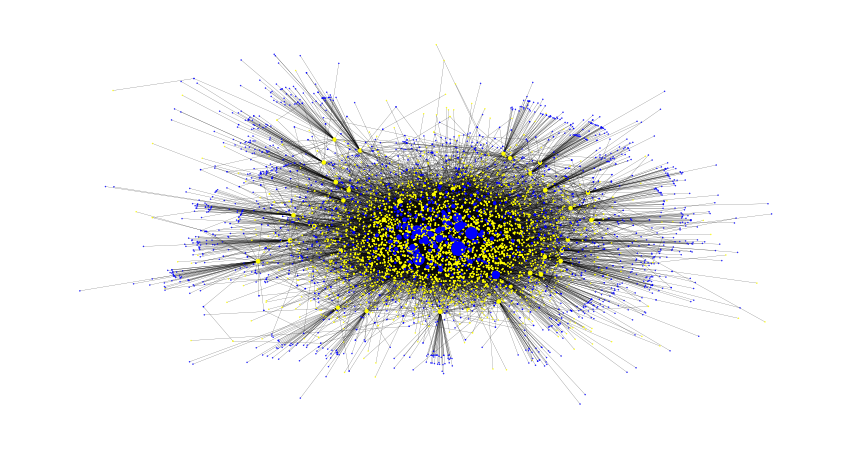

In [20]:

# plot the network that represent the degree of nodes 
plt.figure(figsize=(15,8))
nx.draw_networkx(bipartite_G, pos=pos, node_size=node_size, with_labels=False, width=0.15,node_color=colors)
plt.axis('off')

<h3> 2.K-core </h3>

In [53]:
# get dict for k-core and clients  & k-core and products
# extract number of k core for clients
kcore_client_dict = dict([ c for c in nx.core_number(bipartite_G).items() if c[0].startswith('C')])

# number of k core for products 
kcore_prod_dict = dict([ c for c in nx.core_number(bipartite_G).items() if c[0].startswith('P')])


# extract number of k core for clients
kcore_client = [ kcore for c,kcore in nx.core_number(bipartite_G).items() if c[0].startswith('C')]
print(sorted(kcore_client,reverse=True)[:5])
# number of k core for products 
kcore_prod = [ kcore for c,kcore in nx.core_number(bipartite_G).items() if c[0].startswith('P')]
print(sorted(kcore_prod,reverse=True)[:5])

print('mean kcore for client:',np.mean(kcore_client)) #mean= 2.0475
print('mean kcore for client:',np.std(kcore_client)) #std= 1.43

[7, 7, 7, 7, 7]
[7, 7, 7, 7, 7]
mean kcore for client: 2.6345
mean kcore for client: 1.927150681706026


/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/p

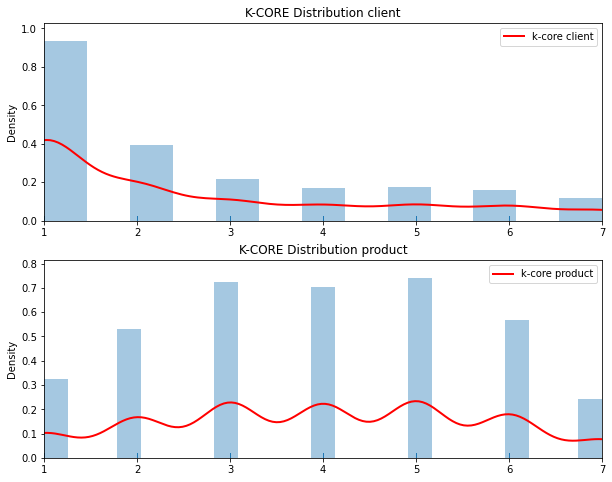

In [135]:
# check the distribution k-core for clients and products:
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)

sns.distplot(kcore_client,rug=True,hist=True,kde_kws={"color": "r", "lw": 2, "label": "k-core client"})
plt.title('K-CORE Distribution client')
plt.xlim(1,7)

plt.legend(loc='upper right')

plt.subplot(2,1,2)
sns.distplot(kcore_prod,rug=True,hist=True,kde_kws={"color": "r", "lw": 2, "label": "k-core product"})
plt.xlim(1,7)

plt.legend(loc='upper right')
plt.title('K-CORE Distribution product')

plt.show()

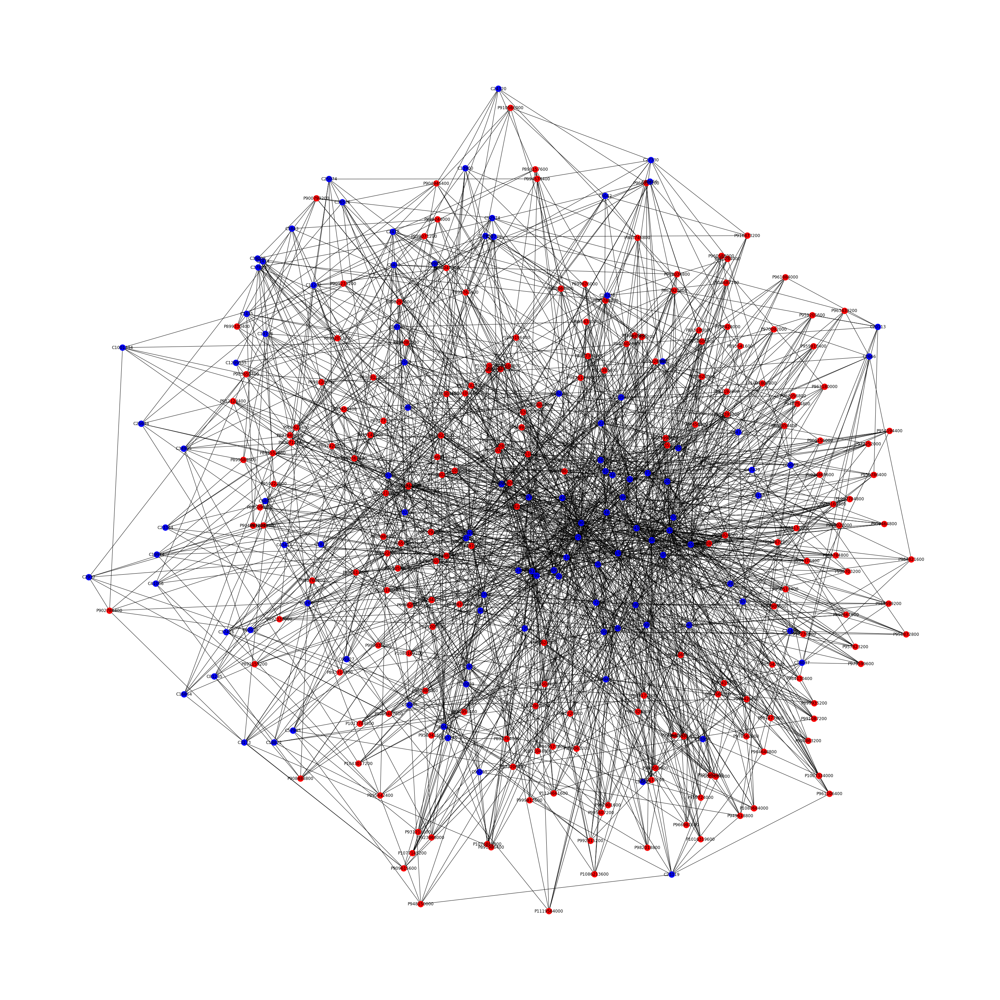

In [86]:
colors =[]

for node in g:
    if node.startswith('C'):
        colors.append("blue")
    else:
        colors.append("red")
        
 # plot the data 
%matplotlib inline
plt.figure(figsize=(30,30))
pos = nx.spring_layout(g, iterations=15, seed=1721)
nx.draw(g,with_labels = True,pos = pos,node_color=colors)  

<h3> 3.Closeness </h3>

In [ ]:
# get closeness centrality of network and add it as attribute of nodes
closeness_dict =nx.closeness_centrality(bipartite_G)
nx.set_node_attributes(bipartite_G, closeness_dict, 'betweenness')

In [144]:
closeness_client = [c for c in nx.closeness_centrality(bipartite_G).items() if c[0].startswith('C')]
print(sorted(closeness_client,key=lambda x:x[1],reverse=True)[:5])

closeness_product = [p for p in nx.closeness_centrality(bipartite_G).items() if p[0].startswith('P')]
print(sorted(closeness_product,key=lambda x:x[1],reverse=True)[:5])


[('C45796', 0.36101813110181313), ('C41982', 0.34158089205595144), ('C36183', 0.3404577140602394), ('C14938', 0.33788017230126616), ('C77577', 0.3353848147188391)]
[('P897516000', 0.353523627424201), ('P903823200', 0.35003380662609873), ('P896911200', 0.349986479177934), ('P896824800', 0.3432568624850815), ('P897602400', 0.34307488402915837)]


(-1.1864008167386053,
 0.9616473773121834,
 -0.8077835032343865,
 0.7362396308779717)

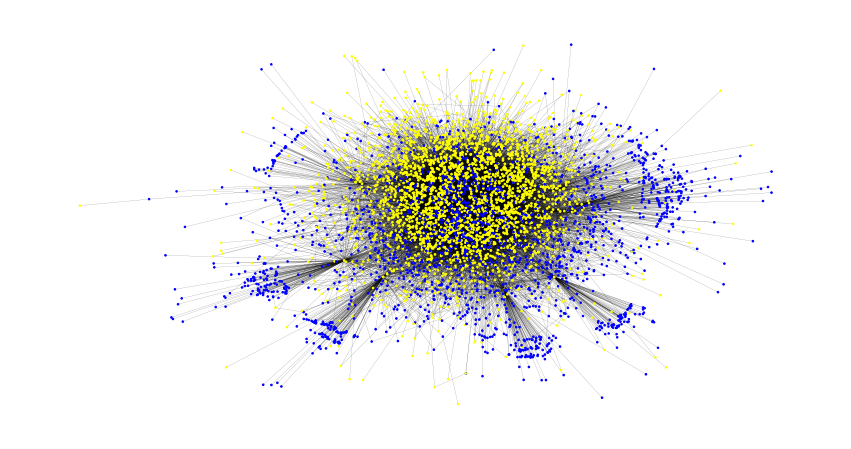

In [12]:
# plot network that represent closeness centrality:
node_size =  [v * 10 for v in closeness_dict.values()] 
# plot the network that represent the degree of nodes 
plt.figure(figsize=(15,8))
pos = nx.spring_layout(bipartite_G, iterations=15, seed=1721)
nx.draw_networkx(bipartite_G, pos=pos, node_size=node_size, with_labels=False, width=0.1,node_color=colors)
plt.axis('off')

<h3> 4.betweenness </h3> 

In [14]:
bet_dict =nx.betweenness_centrality(bipartite_G)

In [115]:
nx.set_node_attributes(bipartite_G,bet_dict,'betweenness')

In [145]:
# get betweenness seperately for client and product 

bet_client = [c for c in nx.betweenness_centrality(bipartite_G).items() if c[0].startswith('C')]
print(sorted(bet_client,key=lambda x:x[1],reverse=True)[:5])

bet_product = [p for p in nx.betweenness_centrality(bipartite_G).items() if p[0].startswith('P')]
print(sorted(bet_product,key=lambda x:x[1],reverse=True)[:5])


[('C36818', 0.07830451016121061), ('C14938', 0.0714162095147616), ('C36183', 0.06566332278810953), ('C11867', 0.055618916451175324), ('C77577', 0.05523481080917095)]
[('P897602400', 0.09998659483595215), ('P897861600', 0.07023685911048964), ('P897516000', 0.06819744611745968), ('P896824800', 0.06117091196957389), ('P897775200', 0.06115895375567628)]


(-1.1864008167386053,
 0.9616473773121834,
 -0.8077835032343865,
 0.7362396308779717)

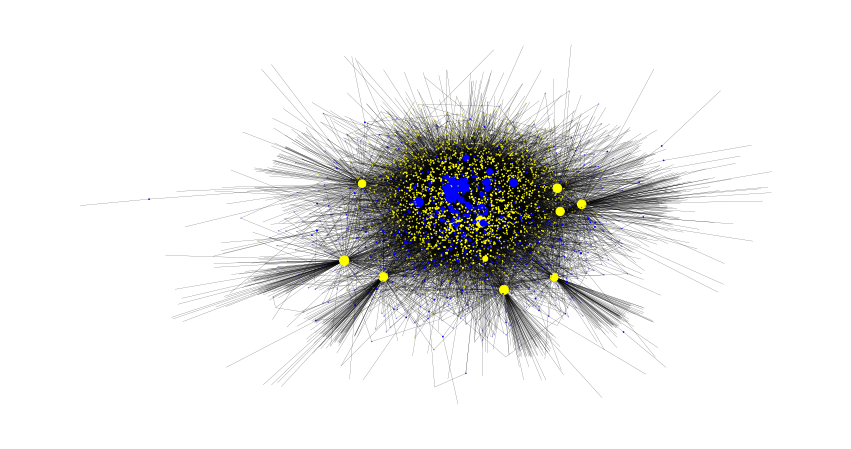

In [15]:
node_size =  [v * 1200 for v in bet_dict.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15,8))
nx.draw_networkx(bipartite_G, pos=pos, node_size=node_size, with_labels=False, width=0.15,node_color=colors)
plt.axis('off')

clustering coefficient

In [149]:
c = bipartite.clustering(bipartite_G)

In [153]:

# get clustering coefficient seperately for client and product 

c_client = [cli for cli in c.items() if cli[0].startswith('C')]
print(sorted(c_client,key=lambda x:x[1],reverse=True)[:5])

c_product = [p for p in c.items() if p[0].startswith('P')]
print(sorted(c_product,key=lambda x:x[1],reverse=True)[:5])

[('C80866', 0.6198761054289671), ('C96733', 0.6198761054289671), ('C137678', 0.6198761054289671), ('C154748', 0.6198761054289671), ('C197196', 0.6198761054289671)]
[('P881276400', 0.42991854891127723), ('P881103600', 0.42991854891127723), ('P881535600', 0.4299185489112772), ('P1014505200', 0.2942690025175437), ('P937519200', 0.2942690025175437)]


In [154]:
df1 = pd.DataFrame(client_degree,columns=['client','degree'])
df2 = pd.DataFrame(kcore_client_dict.items(),columns=['client','kcore'])
df3 = pd.DataFrame(closeness_client,columns=['client','closeness'])
df4 = pd.DataFrame(bet_client,columns=['client','betweenness'])
df5 = pd.DataFrame(c_client,columns=['client','clustering'])

cent_client = pd.merge(df1,df2,on='client').merge(df3,on='client').merge(df4,on='client').merge(df5,on='client')
# I add k-core later 
cent_client.head()


,client,degree,kcore,closeness,betweenness,clustering
0,C1828650,1,1,0.235233,0.000000,0.570394
1,C139624,1,1,0.247632,0.000000,0.566568
2,C1014523,3,2,0.247254,0.000203,0.241728
3,C379799,5,5,0.271587,0.000078,0.135633
4,C677732,1,1,0.245705,0.000000,0.571730


In [155]:
df1 = pd.DataFrame(product_degree,columns=['product','degree'])
df2 = pd.DataFrame(kcore_prod_dict.items(),columns=['product','kcore'])
df3 = pd.DataFrame(closeness_product,columns=['product','closeness'])
df4 = pd.DataFrame(bet_product,columns=['product','betweenness'])

cent_prod = pd.merge(df1,df2,on='product').merge(df3,on='product').merge(df4,on='product')
cent_prod.head()

,product,degree,kcore,closeness,betweenness
0,P1133564400,3,3,0.290093,0.000158
1,P1033164000,5,5,0.279294,0.000221
2,P1094594400,5,5,0.274904,0.000161
3,P913158000,5,5,0.266911,0.000124
4,P919465200,1,1,0.236739,0.000000


In [79]:
cent_client.to_csv('./cent_client.csv')
cent_prod.to_csv('./cent_prod.csv')

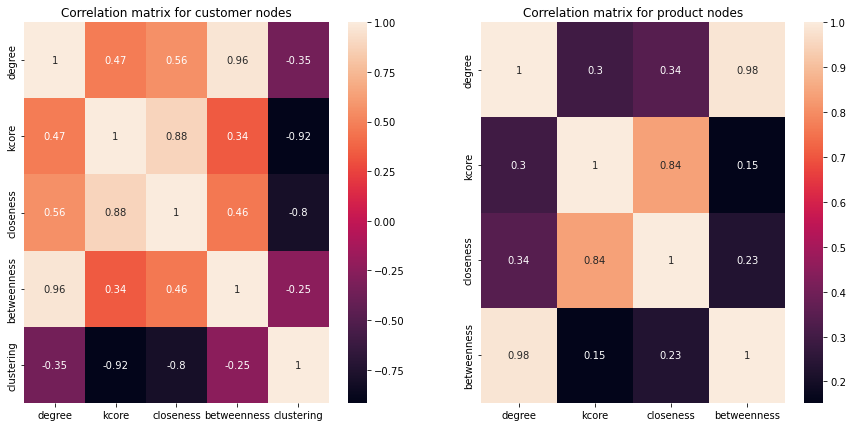

In [156]:
%matplotlib inline
# get the correlation between all centralities:
corr1 = cent_client.iloc[:,1:].corr()
corr2 = cent_prod.iloc[:,1:].corr()

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
sns.heatmap(corr1,annot=True)
plt.title('Correlation matrix for customer nodes')


plt.subplot(1,2,2)
sns.heatmap(corr2,annot=True)
plt.title('Correlation matrix for product nodes')
plt.show()


When it comes to the correlation between different centrality metrics , we could found the similarity between product nodes and customer nodes. But globally the correlation of centrality metrics for product nodes is slightly lower than that for product nodes. It's probably because the customer are more connected with multiple products on average but for some products which have only few reviews are less connected with each other. 
 
If we look into this plot, we found the positive correlation between degree and betweenness / number of kcore and closeness, therefore we can come to the conclusion that these indicators intercorrelate with each other.

So in this case, it would be more interesting to observe the network for clients.



Slope: 7.348 / Intercept: -10.865
Pearson corr: 0.469 / p-value: 0.000


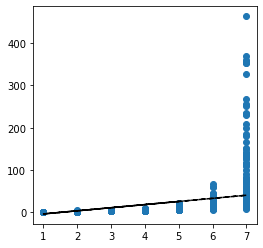

In [52]:
# let's have a look on the correlation between degree and betweennes:


#import scipy.stats as st

%matplotlib inline


#Alternative: use dataframe in pandas
#x = df6.iloc[:,2]         # i.e. x has the k-core of nodes, stored in dataframe df6 (column 2)
#y = df6.iloc[:,0]         # i.e. y has the degree of nodes, stored in dataframe df6 (column 0)

a = linregress(cent_client['kcore'] , cent_client['degree'])        # calculate linear regression and send output to a
print("Slope: %.3f / Intercept: %.3f" % (a[0], a[1]) )
print("Pearson corr: %.3f / p-value: %.3f" % (a[2], a[3]) )

plt.figure(figsize=(4, 4))

plt.scatter(cent_client['kcore'] , cent_client['degree'])                       # scatter plot of x and y values
y_fit = [i * a[0] + a[1] for i in cent_client['kcore']]    # calculate y values -for the given x values- based on the fitted parameters a[0] (slope) a[1] (intercept)
plt.plot(cent_client['kcore'], y_fit, 'k--')               # plot x vs. y values

# Or use numpy arrays
#import numpy as np
#plt.plot(np.arange(7), np.arange(7)*slope+intercept, 'k--')

plt.show()




<AxesSubplot:xlabel='kcore', ylabel='closeness'>

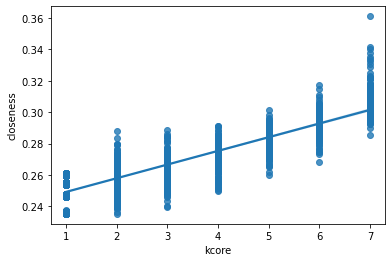

In [53]:
# correlation between the number of kcore and closeness
sns.regplot(x=cent_client['kcore'],y=cent_client['closeness'])

# Network Clustering 

Clustering in a network aims to group nodes based on their similarities, this metrics refers to the interconnectivity between different nodes. nodes in the same cluster are highly similar to each other.

<h3> 1. Clustering coefficient </h3>

In [41]:
# get average clustering for clients 
print('average clustering coefficient for client nodes:',bipartite.average_clustering(bipartite_G,x))

print('average clustering coefficient for product nodes:',bipartite.average_clustering(bipartite_G,y))

average clustering coefficient for client nodes: 0.4196790246645244
average clustering coefficient for product nodes: 0.1781156224092261


We assume that the reason for the lower average clustering coefficient of products nodes is because many products have large number of degree but low betweenness ( product easily get review from many clients who only review once)

<H3> 2.Community </H3>

A community is a group of nodes, so that nodes inside the group are connected with many more edges than between groups.

In [44]:
dict_v = nx.community.label_propagation_communities(bipartite_G)

In [120]:
def community_plot (G):
    colors = []
    counter = 0
    for com in nx.community.label_propagation_communities(G):
        color = '#%06X' % np.random.randint(0, 0xFFFFFF)  # creates random RGB color
        counter += 1
        for node in com:  # fill colors list with the particular color for the community nodes
            colors.append(color)
    print('The number of communities in the network:',counter)
    plt.figure(figsize=(15,9))
    plt.axis('off') 
    pos = nx.spring_layout(G, iterations=15, seed=1721)
    nx.draw_networkx(G, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors)
    
    
    

The number of communities in the network: 118


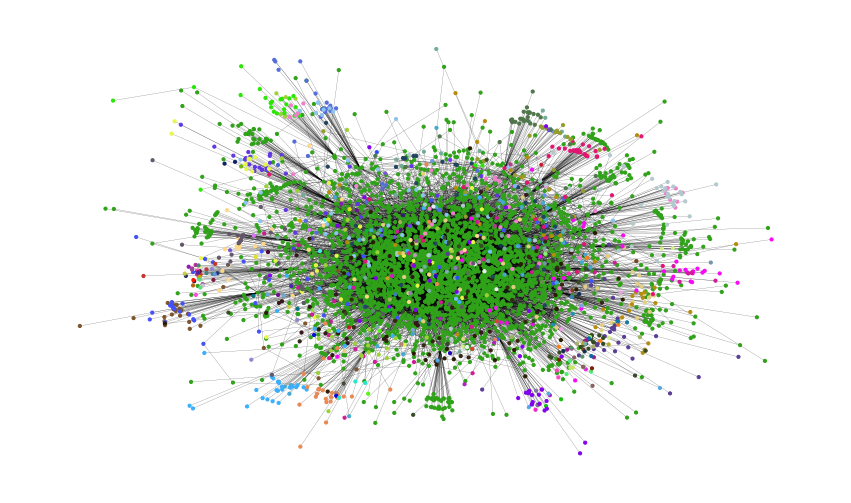

In [59]:
community_plot(bipartite_G)

The number of communities in the network: 3


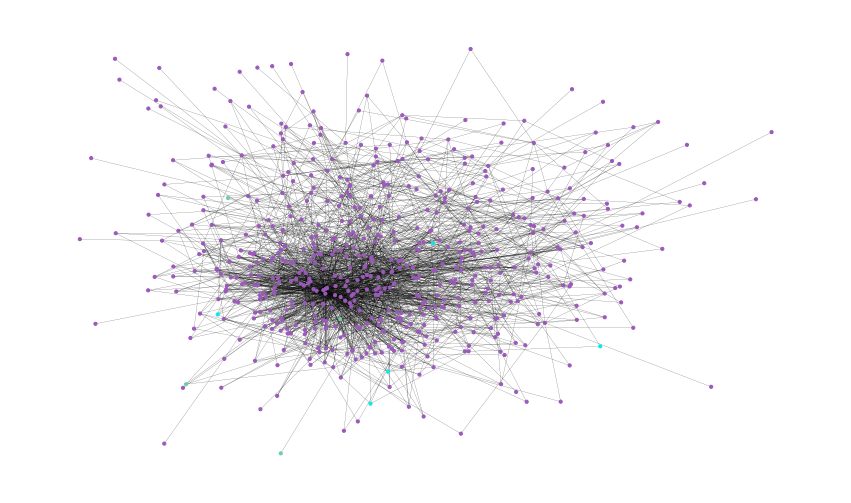

In [121]:
# let's remove the nodes with less than 6 degrees and try again 
g_simp = bipartite_G.copy()
for node,degrees in dict(g_simp.degree()).items():
    if degrees <=6 :
        g_simp.remove_node(node)

community_plot(g_simp)

We can't get insightful information from the above plot because this network is closely connected(we also try to remove some nodes with less than 6 degrees but no any finding ) \
Therefore we decide to get customer-customer projection and find the communities in this sub-graph

<h4> 2.1 Community for customer - customer projections </h4> 
we could see the similarity between the customers in a same group => 

In [74]:
# get the customer - customer projections( we put edges between two clients related to the same products)
C = nx.bipartite.projection.projected_graph(bipartite_G,x)

C = nx.Graph(C)                                 # Remove multiple edges
C.remove_edges_from(nx.selfloop_edges(C) )     # Remove self-loops

In [93]:
print(C.number_of_edges())
print(C.number_of_nodes())
print('If network is bipartite:',bipartite.is_bipartite(C))
print('density of network:',bipartite.is_bipartite(C))

78274
2000
If network is bipartite: False


The number of communities in the network: 2


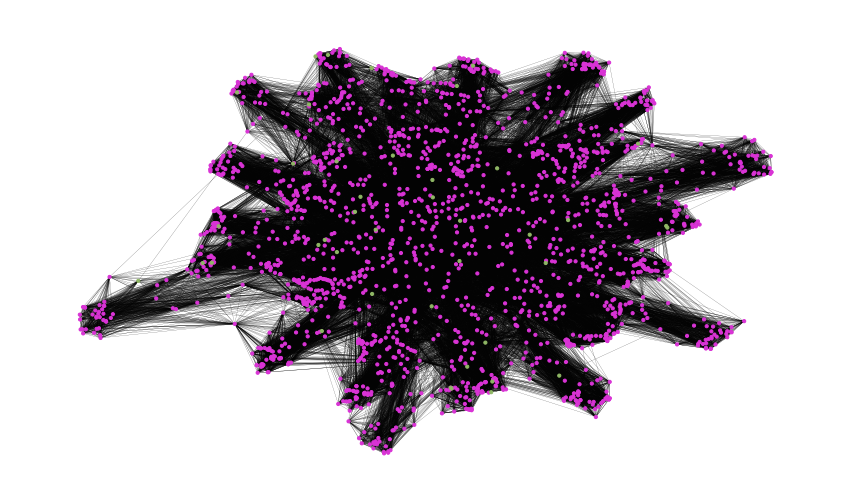

In [122]:
community_plot(C)

# Power law

  \
<h3> 1. Degree Distribution </h3>

In [136]:
# Make the histogram of degree per clients
x,y = bipartite.sets(bipartite_G)
pro_deg_dict,cli_deg_dict = bipartite.degrees(bipartite_G,x)

In [140]:
# Make the histogram of degree per clients
pro_deg_dict,cli_deg_dict = bipartite.degrees(bipartite_G,x)

cli_degree = [degree for (node,degree) in cli_deg_dict]
pro_degree = [degree for (node,degree) in pro_deg_dict]


cli_deg_n = [x / len(cli_degree) for x in cli_degree] # normalized 
pro_deg_n = [x / len(pro_degree) for x in pro_degree] # normalized 

c_deg = list(range(0,len(cli_degree)))
p_deg = list(range(0,len(pro_degree)))

<BarContainer object of 464 artists>

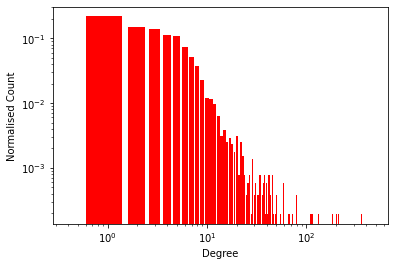

In [106]:
d_deg_all = nx.degree_histogram(bipartite_G) # get the degree for all nodes 
d_deg_all_n = [x / bipartite_G.number_of_nodes() for x in d_deg_all] # normalized 
c_deg_all = list(range(0,len(d_deg_all)))

plt.ylabel('Normalised Count')
plt.xlabel('Degree')
plt.yscale('log')
plt.xscale('log')
plt.bar(c_deg_all,d_deg_all_n, width=0.8, color='r')

In [148]:
len(all_degree)

5178

<BarContainer object of 5178 artists>

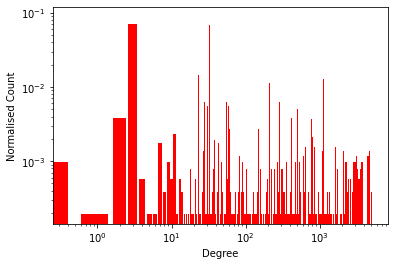

In [149]:
all_degree = cli_degree+pro_degree
d_deg_all_n = [x / len(all_degree) for x in all_degree] # normalized 
c_deg_all = list(range(0,len(all_degree)))

plt.ylabel('Normalised Count')
plt.xlabel('Degree')
plt.yscale('log')
plt.xscale('log')
plt.bar(c_deg_all,d_deg_all_n, width=0.8, color='r')

<h3> 2.Power law simulation </h3>

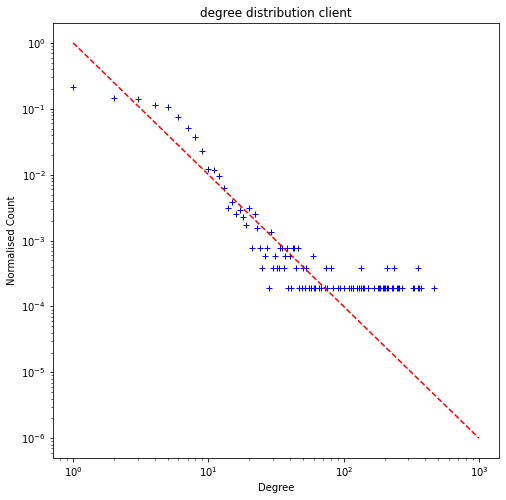

In [107]:
# Draw the plot for all degree distribution
plt.figure(figsize=(8,8))


plt.ylabel('Normalised Count')
plt.xlabel('Degree')
plt.yscale('log')
plt.xscale('log')
plt.title('degree distribution client')
plt.plot(c_deg_all, d_deg_all_n, 'b+')

# Draw an eye-guide curve. In this case a power-law with exponent 1.8
x = list( range(1,1000) )               # Create the values for x
y = list( [ 1/(i**2) for i in x ] )  
plt.plot(x, y, 'r--') 

plt.show()

simulate pdf & cumulative pdf of all degrees (client&product) 

In [118]:
%matplotlib inline
import powerlaw as pw

plot and simulate seperately pdf & cumulative pdf for client and for product

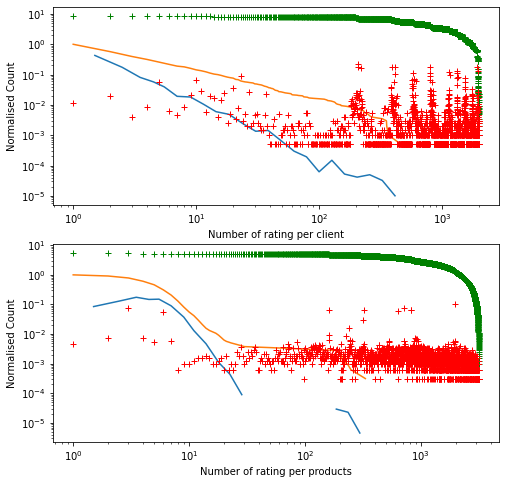

In [199]:
%matplotlib inline
import powerlaw as pw

# Plot distribution of number of rating for client 
#---------------------------------------------------------------------------------------------------------------------

plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plt.ylabel('Normalised Count')
plt.xlabel('Number of rating per client') # degree  = how many times customer reviews 
plt.yscale('log')
plt.xscale('log')

# To plot the pdf and the cumulative pdf of the degree
pw.plot_pdf(cli_deg)                            
pw.plot_ccdf(cli_deg)

#---------------------------------------------------------------------------------------------------------------------
# check the scattered plot

cum_cli = len(cli_deg)*[0]
i = 1
while i < len(cli_deg):    
    cum_cli[i] = sum( cli_deg_n[i:len(cli_deg)] )         # calculate the cumulative distribution for each value of degree k
    i += 1                                          # equivalent to i = i + 1
plt.plot(c_deg, cum_cli, 'g+')                        # for the cumulative plot using green crosses
plt.plot(c_deg, cli_deg_n, 'r+')                      # for the pdf plot using red crosses


# Plot distribution of number of rating for client 
#---------------------------------------------------------------------------------------------------------------------

plt.subplot(2,1,2)
plt.ylabel('Normalised Count')
plt.xlabel('Number of rating per products') # degree  = how many times product receive reviews 
plt.yscale('log')
plt.xscale('log')
# To plot the pdf and the cumulative pdf of the degree
pw.plot_pdf(pro_deg)                            
pw.plot_ccdf(pro_deg)

# check the scattered plot
cum_pro = len(pro_deg)*[0]
i = 1

while i < len(pro_deg):    
    cum_pro[i] = sum( pro_deg_n[i:len(pro_deg)])         # calculate the cumulative distribution for each value of degree k
    i += 1                                          # equivalent to i = i + 1
plt.plot(p_deg, cum_pro, 'g+')                        # for the cumulative plot using green crosses
plt.plot(p_deg, pro_deg_n, 'r+')   



Fig. 1 depicts the distribution of the number of ratings per clients and number of ratings per product. Both distributions exhibit clear power law characteristics with a long tail of “popular” items and very active users, and a very large set of items and users associated with few ratings.

In [145]:
# Fitting the data to a power-law -> "fit" is an object that contains statistical information about the fitting
fit = pw.Fit(cli_deg)                             # input is the list of degrees

# Exponent of the power-law alpha
print("Exponent: %.3f" % fit.alpha )
# sigma is the standard error of the exponent alpha, i.e. "alpha +- sigma". To calculate the confidence interval (CI) from the error, see https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1255808/  C.I (95%)= [alpha +- 1.95*error] 
print("Exponent error: %.4f" % fit.sigma )

# x_min is defined by testing various (xmin) and calculating the minimal "Kolmogorov-Smirnov distance" (D) 
# between the data and the fit
print("Kolmogorov-Smirnov: %.4f" % fit.D)   # (goodness of fit) the fit function finds the minimal Kolmogorov-Smirnov "distance" between the data and the fit to a power-law. It is a measure of difference between two distributions. For more details, see https://www.itl.nist.gov/div898/handbook/eda/section3/eda35g.htm
print("x_min: ", fit.xmin)                  # x_min is given such that D is minimised




Exponent: 2.042
Exponent error: 0.0549
Kolmogorov-Smirnov: 0.0401
x_min:  8.0


Calculating best minimal value for power law fit
/Applications/anaconda3/lib/python3.8/site-packages/powerlaw.py:699: RuntimeWarning: invalid value encountered in true_divide
  (CDF_diff**2) /


<h3> 2. Distribution mean rating of client/product </h3>

In [192]:
list_clients = edge_list[['client','weight']]
list_weight = edge_list[['product','weight']]

,client,product,weight
0,C1414,P950223600,4.0
1,C1414,P898725600,4.0
2,C1414,P898207200,1.0
3,C1414,P897861600,2.0
4,C1414,P896652000,3.0
...,...,...,...
16980,C49088,P1011999600,4.0
16981,C54777,P905896800,4.0
16982,C154116,P1071615600,5.0
16983,C204328,P910479600,3.0


In [157]:
# if cli.startswith('C')
list_clients = [cli for (cli,prod,weight) in bipartite_G.edges(data=True) ]
list_pro = [prod for (cli,prod,weight) in bipartite_G.edges(data=True)  ]
list_weight= [weight['weight'] for (cli,prod,weight) in bipartite_G.edges(data=True) ]

In [158]:
edge_list = pd.DataFrame({'client':list_clients,'product':list_pro,'weight':list_weight})
edge_list['weight']=edge_list['weight'].apply(lambda x:float(x))

,client,product,weight
0,C1414,P950223600,4.0
1,C1414,P898725600,4.0
2,C1414,P898207200,1.0
3,C1414,P897861600,2.0
4,C1414,P896652000,3.0


In [167]:
# get the mean rating per client / per product 

mean_rating_client = edge_list.groupby('client').agg({'weight':'mean'}).reset_index()
mean_rating_client.columns=['node','mean_ratings']
mean_rating_product = edge_list.groupby('product').agg({'weight':'mean'}).reset_index()
mean_rating_product.columns=['node','mean_atings']

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/Applicatio

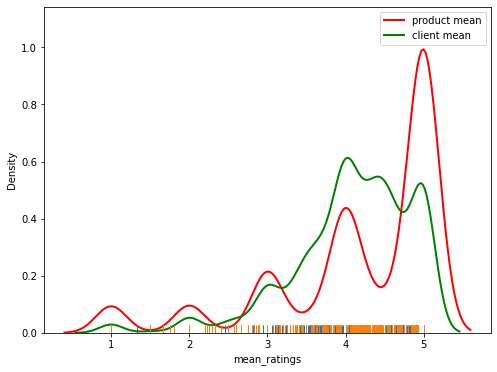

In [298]:
import seaborn as sns 

plt.figure(figsize=(8,6))
sns.distplot(mean_rating_product['mean_ratings'],rug=True, hist=False,kde_kws={"color": "r", "lw": 2, "label": "product mean"})
sns.distplot(mean_rating_client['mean_ratings'],rug=True, hist=False,kde_kws={"color": "g", "lw": 2, "label": "client mean"})

plt.legend(loc='upper right')
plt.show()

# Random Network 

<h3>Random Network for client-client projection </h3>

1.Create random network with fixed degree distribution ( swap the nodes of one of the ends)

In [71]:
# get the customer - customer projections( we put edges between two clients related to the same products)
# Degree sequence for node set A
x,y = bipartite.sets(bipartite_G)
C = nx.bipartite.projection.projected_graph(bipartite_G,x)

C = nx.Graph(C)                                 # Remove multiple edges
C.remove_edges_from(list(nx.selfloop_edges(C)))     # Remove self-loops

In [72]:
import random as rg


def create_net(list_edges,number_edges):
    for i in range(4*E):
        index1 = rg.randint(0, E-1)    # 
        index2 = rg.randint(0, E-1)             
        temp = list_edges_temp[index1][0]                       
        list_edges_temp[index1][0] = list_edges_temp[index2][0]  
        list_edges_temp[index2][0] = temp
    
    CM=nx.Graph()
    CM.add_edges_from(list_edges_temp)
    return (CM)

In [74]:
# get list_edges and number_edeges
list_edges_temp = [list(i) for i in list( C.edges())] 
E = C.number_of_edges()

r1 = create_net(list_edges_temp,E)

In [77]:
r2= create_net(list_edges_temp,E)
r3= create_net(list_edges_temp,E)

In [82]:
r4= create_net(list_edges_temp,E)
r5= create_net(list_edges_temp,E)

In [84]:
# stock random network : 
nx.write_gexf(r1,'./random1')
nx.write_gexf(r2,'./random2')
nx.write_gexf(r3,'./random3')
nx.write_gexf(r4,'./random4')
nx.write_gexf(r5,'./random5')

2.compare the measures at global level in the empirical network with the model networks

In [90]:
# compare the measures at global level in the empirical network with the model networks

# get the average cluste
c_mean=[]
list_random = [r1,r2,r3,r4,r5]
for i in list_random:
    c_mean.append(nx.average_clustering(i))
    
asso_mean=[]    
for i in list_random:
    asso_mean.append(nx.degree_assortativity_coefficient(i, weight = True))
    m+=1
    print(m)
    

Avg. clustering of the original network: 0.8529 | randomised network: 0.0594
Assortativity of the original network: 0.0212 | randomised network: -0.0224


In [165]:
c_mean=[c1,c2,c3,c4,c5]


In [166]:
avg_net = nx.average_clustering(C)
avg_random = np.mean(c_mean)

asso_net = nx.degree_assortativity_coefficient(C, weight = True) 
asso_random =  np.mean(asso_mean)

print("Avg. clustering of the original network: %.4f | randomised network: %.4f" %(avg_net, avg_random))
print("Assortativity of the original network: %.4f | randomised network: %.4f" %(asso_net,asso_random ))

Avg. clustering of the original network: 0.8855 | randomised network: 0.1380
Assortativity of the original network: 0.1150 | randomised network: -0.0164


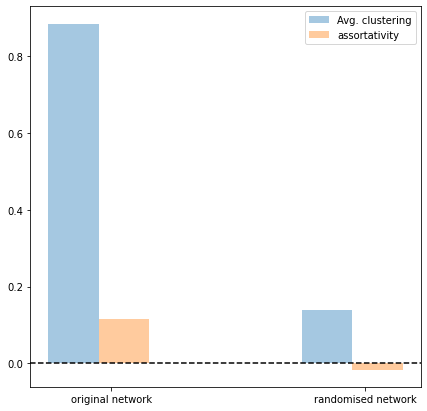

In [167]:
# barplot the average clustering coefficient and assortativity for product 
plt.figure(figsize=(7,7))
x=['original network','randomised network']

plt.bar(np.arange(2),[avg_net,avg_random],width=0.2,label='Avg. clustering',alpha=0.4)
plt.bar(np.arange(2)+0.2,[asso_net,asso_random],width=0.2,label='assortativity',alpha=0.4)

plt.xticks(np.arange(2)+0.15,x)
plt.axhline(y=0,color='k', linestyle='--')
plt.legend(loc='upper right')
plt.show()

3. Calculate the significance of the results using Z-score

In [183]:
# 1st: Calculate the Z-score for the chosen network measure, e.g. the avg. clustering coefficient of the network

Z_score = (avg_net - avg_random)/ np.std(c_mean)

# 2nd: Find the p-value

p_value = scipy.stats.norm.sf( abs(Z_score) )*2.0     # This gives the probability "sf = 1 - cdf" , i.e. 1 minus the cumulative distribution function. You multiple by 2 because this gives one-tail of the distribution


print( "Z-score: %.2f and p-value = %.5f" %(Z_score, p_value) )

Z-score: 7327.61 and p-value = 0.00000


something wrong with strandard deviation(c_mean)